kurze Projektbeschreibung


In [ ]:
import cv2
from ultralytics import YOLO
from PIL import Image
import numpy as np
import os
import csv
import pandas as pd


In [20]:
video_path = "videos/single_videos/single_pushup_fabi1_1.mov"

# Test video 
if not os.path.exists(video_path):
    raise FileNotFoundError(f"Video nicht gefunden: {video_path}")

# Define yolo model
model_pose = YOLO('yolo11n-pose.pt')  # n, s, m, l or x

# Test of numpy version
import numpy as np
print(np.__version__)


1.26.4


Aus dem video werden keypoints in einer csv gespeichert.

Frame 0 (Time: 0.00 s)


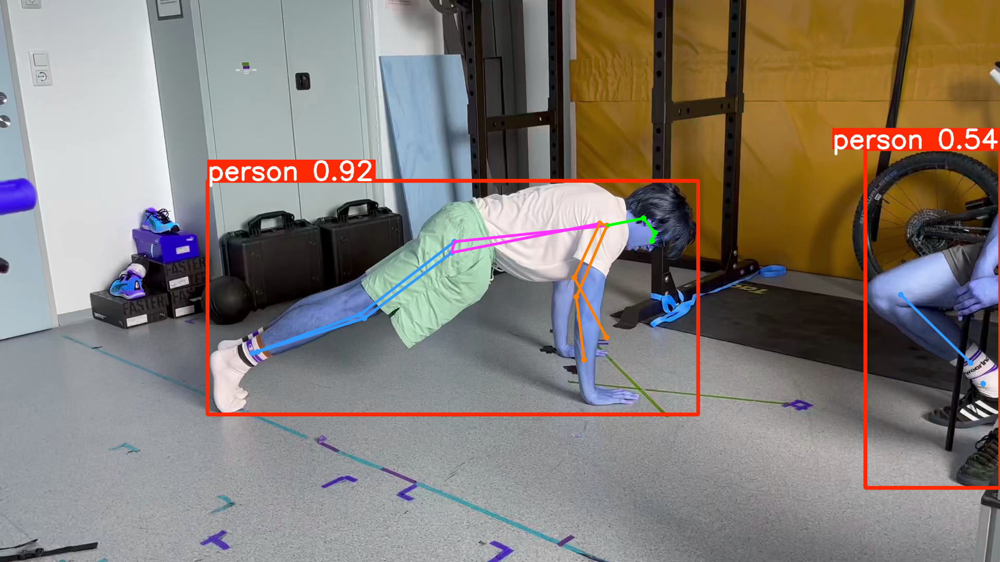

Frame 10 (Time: 0.33 s)


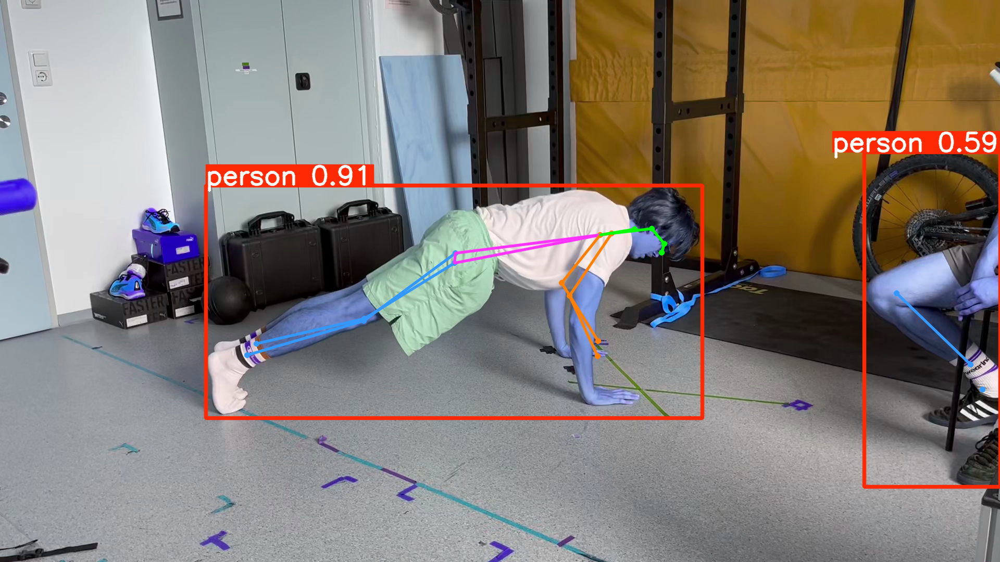

Frame 20 (Time: 0.67 s)


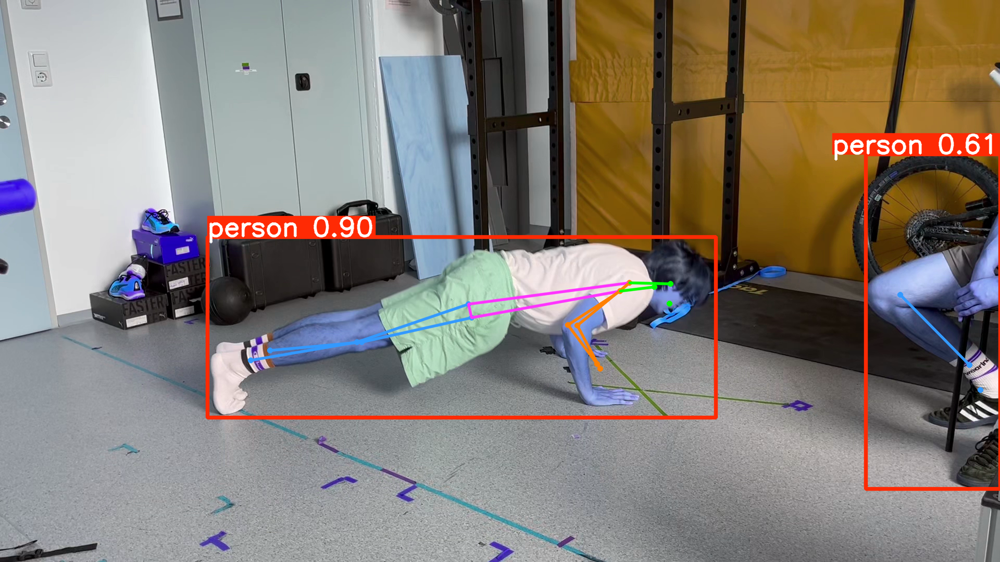

Frame 30 (Time: 1.00 s)


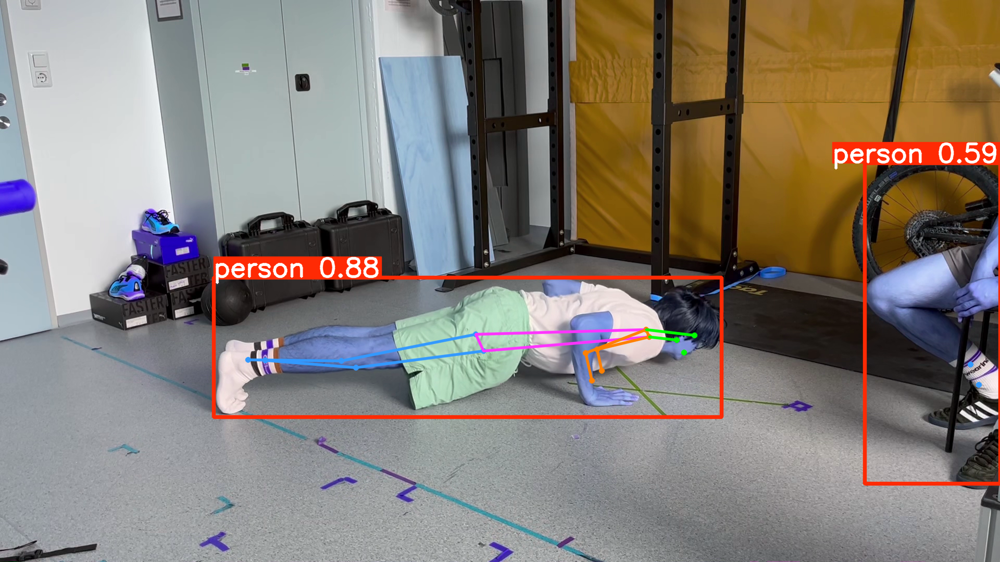

Frame 40 (Time: 1.33 s)


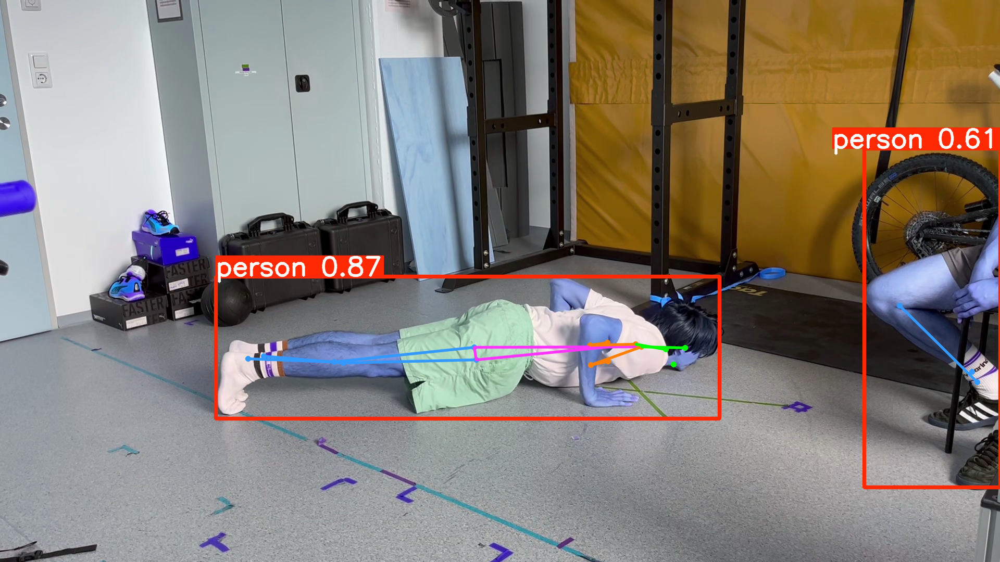

Frame 50 (Time: 1.67 s)


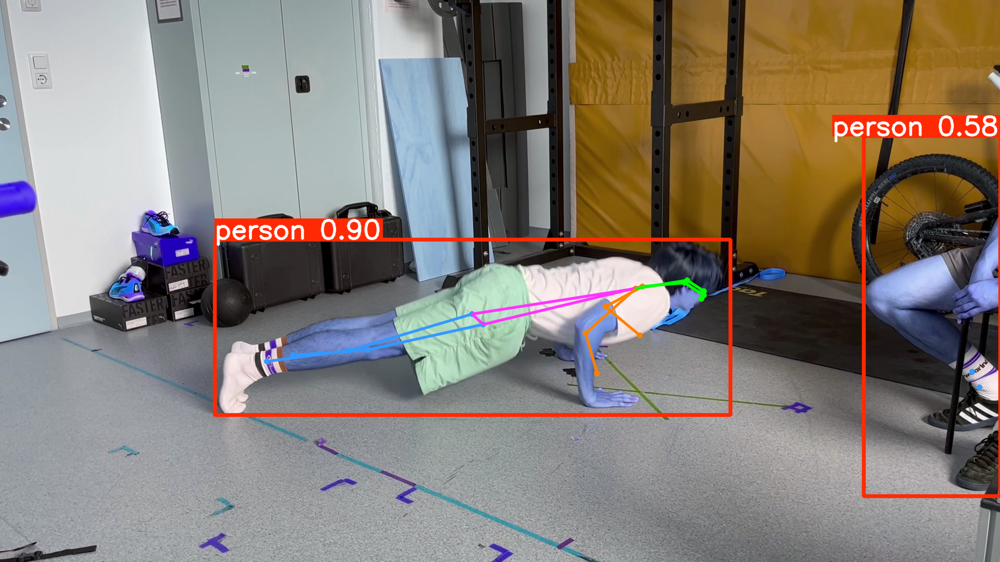

CSV saved to: keypoints_output_single_pushup_fabi1_1.csv


In [21]:
cap = cv2.VideoCapture(video_path)

frame_skip = 10  # only display every nth frame
frame_idx = 0
display_count = 0
max_display = 10

# Get FPS for timestamp calculation
fps = cap.get(cv2.CAP_PROP_FPS)

# Define CSV output file
video_name = os.path.splitext(os.path.basename(video_path))[0]
csv_filename = f"keypoints_output_{video_name}.csv"

output_rows = []  # collect all rows for later saving

# Prepare column headers for CSV
xy_headers = [f"kp_{i}_{coord}" for i in range(17) for coord in ("x", "y")]
conf_headers = [f"kp_{i}_conf" for i in range(17)]
columns = ["frame", "time_sec"] + xy_headers + conf_headers

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    timestamp = frame_idx / fps
    results = model_pose.predict(source=frame, save=False, conf=0.25, verbose=False)

    for result in results:
        # Default: fill all values with NaN
        keypoints_xy = [np.nan] * (17 * 2)
        confidences = [np.nan] * 17

        try:
            keypoints = result.keypoints.xy[0].cpu().numpy()
            confidences = result.keypoints.conf[0].cpu().numpy()

            flattened_xy = []
            for i in range(17):
                try:
                    if i >= len(confidences) or confidences[i] < 0.2:
                        x = np.nan
                        y = np.nan
                    else:
                        x = keypoints[i][0]
                        y = keypoints[i][1]
                except:
                    x = np.nan
                    y = np.nan
                flattened_xy.extend([x, y])

        except:
            pass  # keep NaN if prediction failed

        output_rows.append([frame_idx, timestamp] + flattened_xy + confidences.tolist())

        # Display only selected frames for visual feedback
        if frame_idx % frame_skip == 0 and display_count < max_display:
            print(f"Frame {frame_idx} (Time: {timestamp:.2f} s)")
            im_array = result.plot()
            im = Image.fromarray(im_array)
            display(im)
            display_count += 1

    frame_idx += 1

cap.release()

# Save all collected keypoint data to CSV
df_out = pd.DataFrame(output_rows, columns=columns)

# Clean zeros to NaN
keypoint_cols = [col for col in df_out.columns if col.startswith("kp_")]
df_out[keypoint_cols] = df_out[keypoint_cols].replace(0.0, np.nan)

# Save to CSV
df_out.to_csv(csv_filename, index=False, na_rep="NaN")
print(f"CSV saved to: {csv_filename}")